In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(["2707_20 TB BAL Human neu.svs", 
                         "10080_19 humane BAL Berliner Blau-001.svs", 
                         "10052_19 humane BAL Berliner Blau-001.svs", 
                         "10835_19 humane BAL Berliner Blau.svs", 
                         "10227_19 humane BAL Berliner Blau.svs" 
                        ]))

slides_val = list(set(["14_EIPH_568381 berliner blau-001.svs", "01_EIPH_563479 Turnbull blue.svs" ]))

In [7]:
grade_list = [0, 1]
annotations_path = Path("../../Statistics/EIPH_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations["image_name"] = [name.replace("tiff","svs") for name in annotations["image_name"]]
annotations = annotations[annotations["grade"].isin(grade_list)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
119329,2200930,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 21647, 'x2': 21751, 'y1': 18133, 'y2': ...",22ffc5a6-56da-41ef-bef4-69e54413bddd,1,False,1,SDATA,Inference
119330,2205439,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 4512, 'x2': 4667, 'y1': 8242, 'y2': 8397}",3d0d194e-0fef-4b91-b2d4-957e8007c3b9,1,False,1,SDATA,Inference
119331,2209572,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 1640, 'x2': 1778, 'y1': 17751, 'y2': 17...",0a3b7d83-2f8d-4ed1-a194-e3eaaaa4e7a9,1,False,1,SDATA,Inference
119332,2209835,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 26641, 'x2': 26808, 'y1': 10599, 'y2': ...",54541283-3220-42a6-b9b0-9bbf5af7eda6,1,False,1,SDATA,Inference
119333,2210512,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 9363, 'x2': 9514, 'y1': 21971, 'y2': 22...",47aaea20-97d3-42f2-abd3-88b8d7853ac4,1,False,1,SDATA,Inference


In [8]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'10080_19 humane BAL Berliner Blau-001.svs': PosixPath('../../../Slides/Human/10080_19 humane BAL Berliner Blau-001.svs'),
 '10854_19 humane BAL Turnbull Blau.svs': PosixPath('../../../Slides/Human/10854_19 humane BAL Turnbull Blau.svs'),
 '11480_19 humane BAL Berliner Blau.svs': PosixPath('../../../Slides/Human/11480_19 humane BAL Berliner Blau.svs'),
 '11480_19 humane BAL Turnbull Blau.svs': PosixPath('../../../Slides/Human/11480_19 humane BAL Turnbull Blau.svs'),
 '11_EIPH_575697 Berliner Blau.svs': PosixPath('../../../Slides/Equine/11_EIPH_575697 Berliner Blau.svs'),
 '20_EIPH_576150 berliner blau.svs': PosixPath('../../../Slides/Equine/20_EIPH_576150 berliner blau.svs'),
 '22_EIPH_575216 Turnbull blue.svs': PosixPath('../../../Slides/Equine/22_EIPH_575216 Turnbull blue.svs'),
 '3106_20 BB BAL Human neu.svs': PosixPath('../../../Slides/Human/3106_20 BB BAL Human neu.svs')}

In [9]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "HumanVsEquine"

In [10]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [11]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True)])

In [12]:
def get_y_func(x):
    return x.y

In [13]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate).normalize()

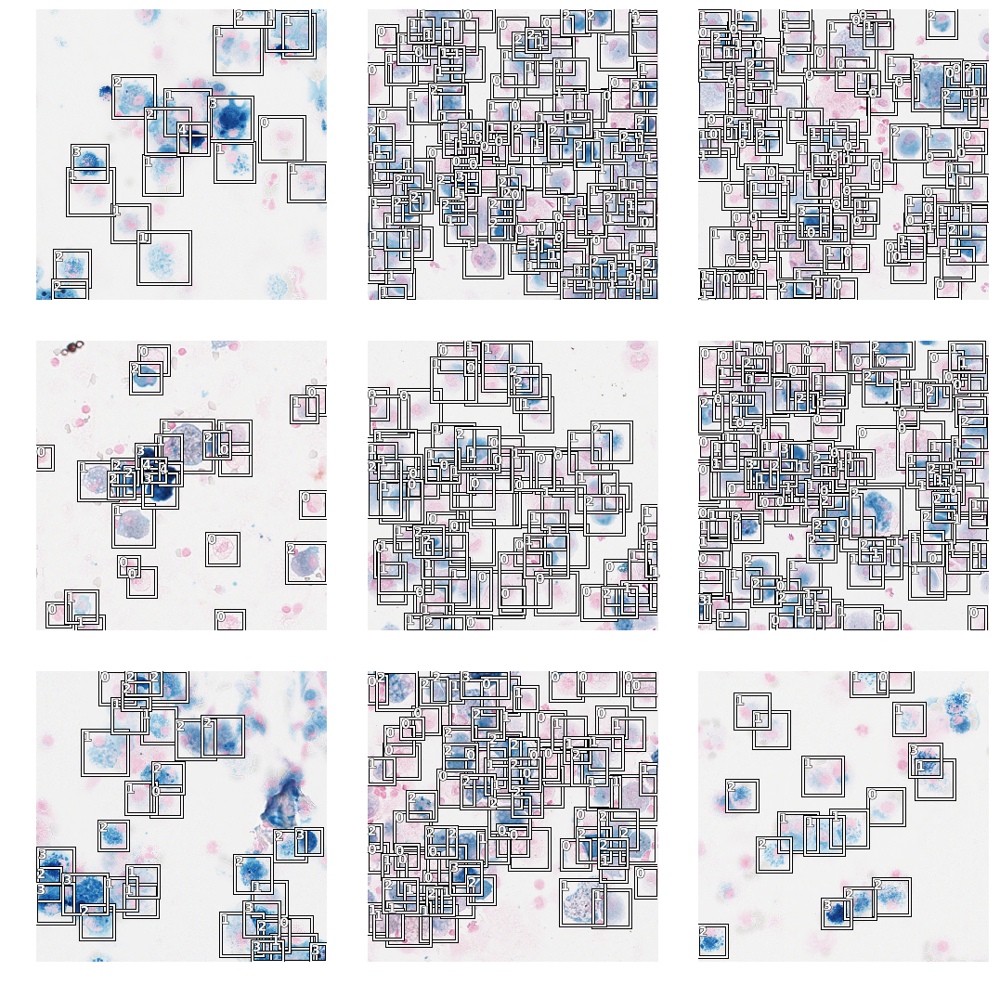

In [14]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

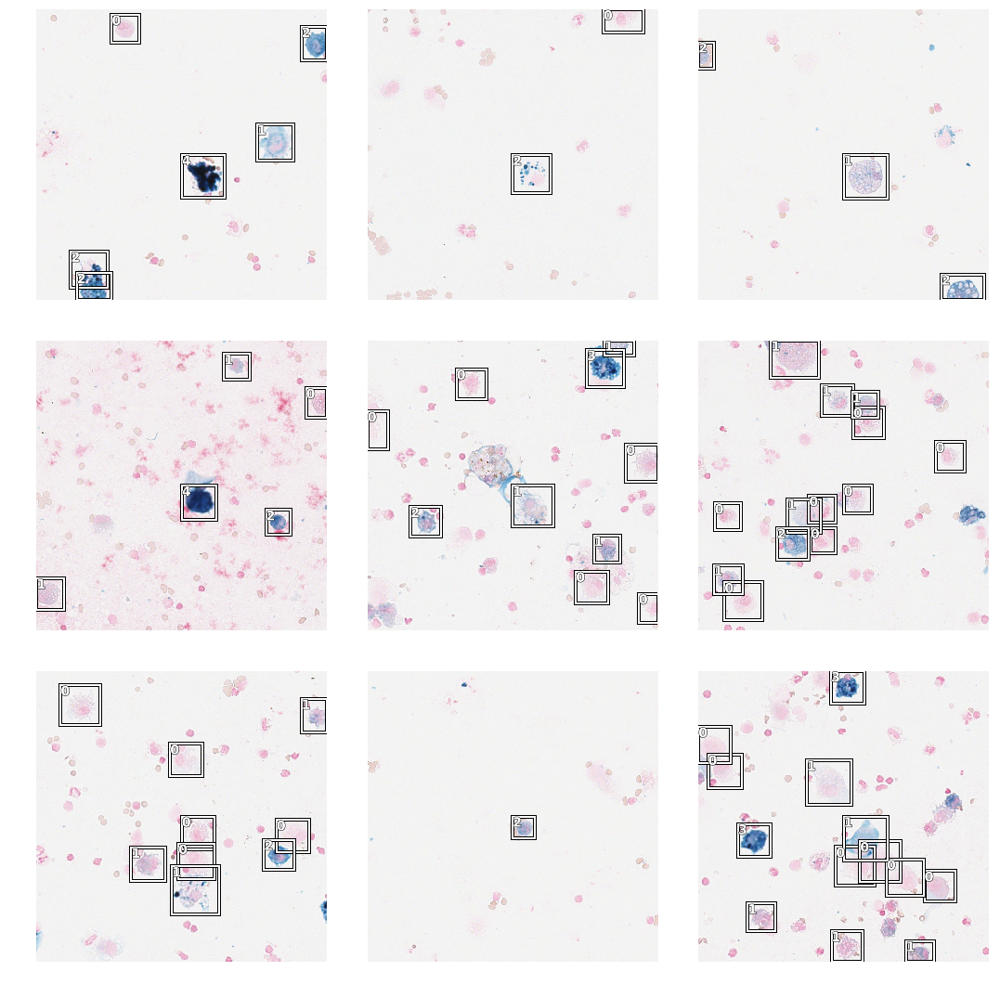

In [15]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [16]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [17]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [18]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=False, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [19]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [21]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,AP-2,AP-3,AP-4,time
0,0.201692,0.360851,0.662449,0.057920,0.302932,0.644531,0.554652,0.673522,0.657417,0.782126,04:25
1,0.282279,0.501918,0.507272,0.098311,0.403607,0.459144,0.633508,0.637994,0.525628,0.280085,04:31
2,0.241296,0.369202,0.634340,0.068102,0.301100,0.631616,0.662731,0.474333,0.610873,0.792146,04:25
3,0.219640,0.412783,0.674785,0.077870,0.334913,0.628322,0.664137,0.638375,0.704947,0.738144,04:27
4,0.193611,0.312933,0.673672,0.069169,0.243765,0.513257,0.706538,0.694515,0.665021,0.789029,04:26
5,0.177737,0.288371,0.695801,0.062282,0.226089,0.620307,0.727204,0.728716,0.667753,0.735026,04:24
6,0.158780,0.322400,0.671644,0.058252,0.264148,0.611582,0.698080,0.677988,0.691292,0.679278,04:26
7,0.145753,0.325807,0.704743,0.058914,0.266893,0.649292,0.741389,0.732366,0.642074,0.758597,04:26
8,0.136065,0.336200,0.691793,0.054334,0.281866,0.640924,0.740573,0.689151,0.661341,0.726975,04:29
9,0.128770,0.326327,0.704377,0.053873,0.272454,0.612324,0.747729,0.703096,0.694142,0.764596,04:25


In [23]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }

torch.save(stats, "{}.p".format(experiment_name))

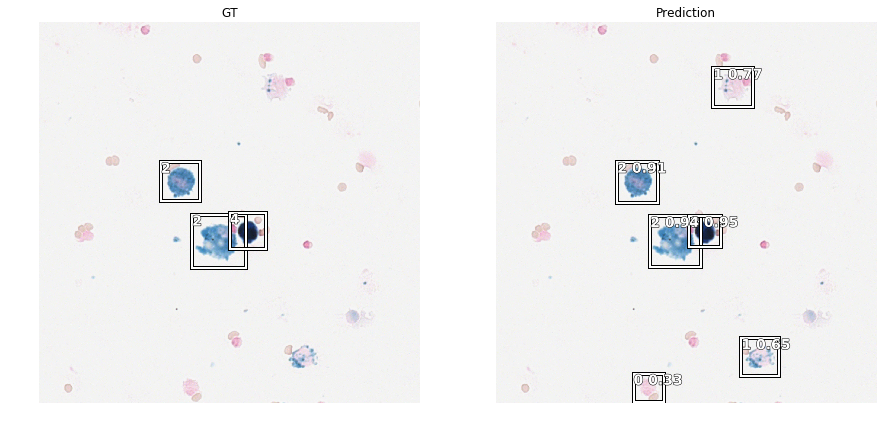

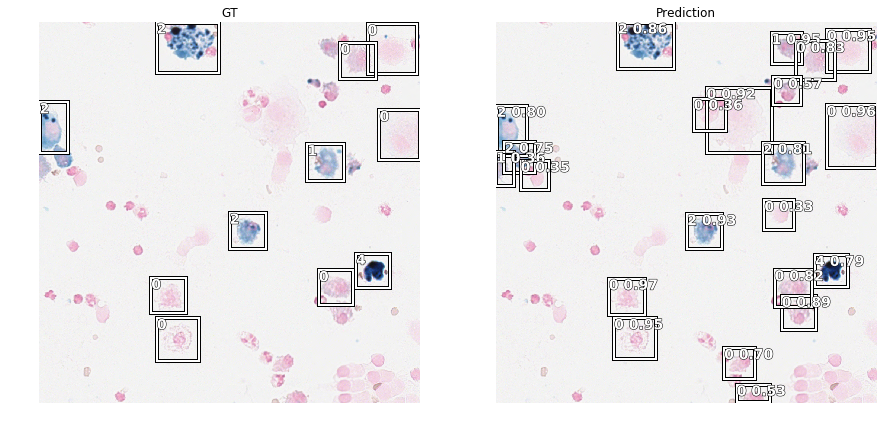

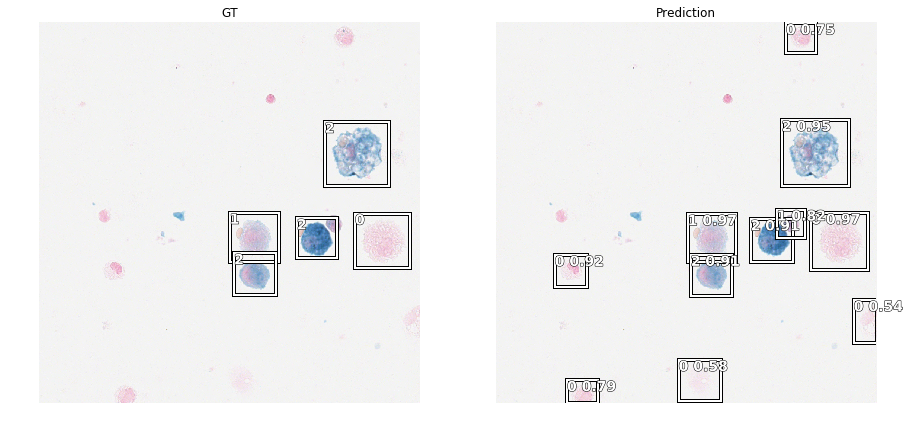

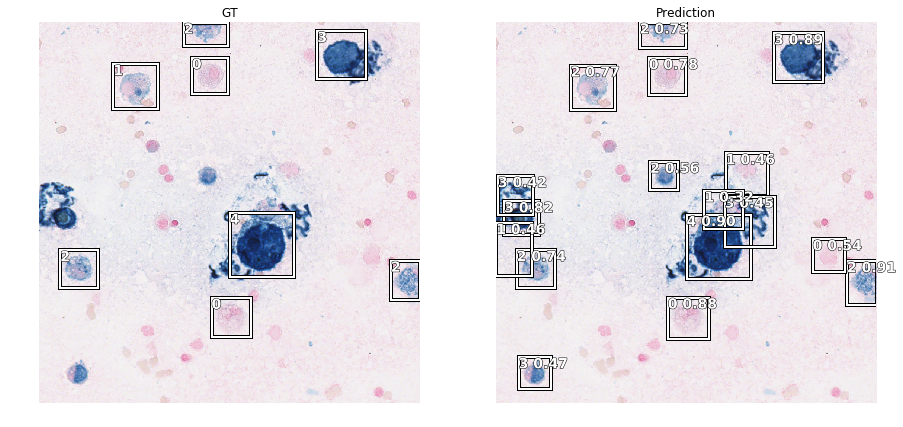

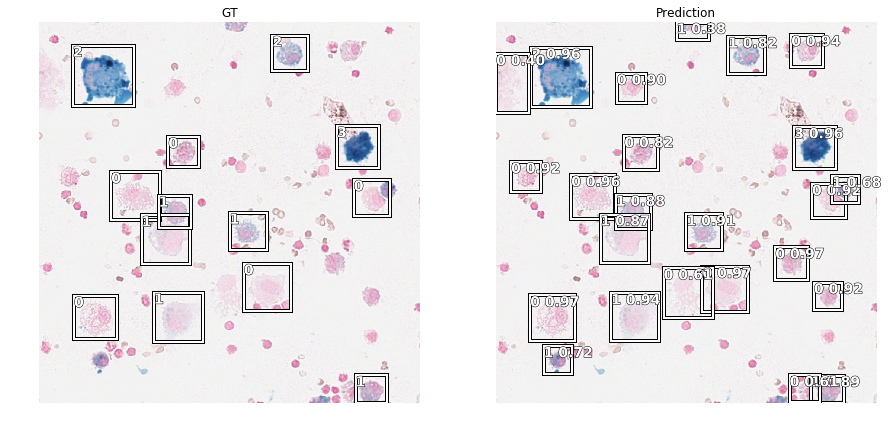

...

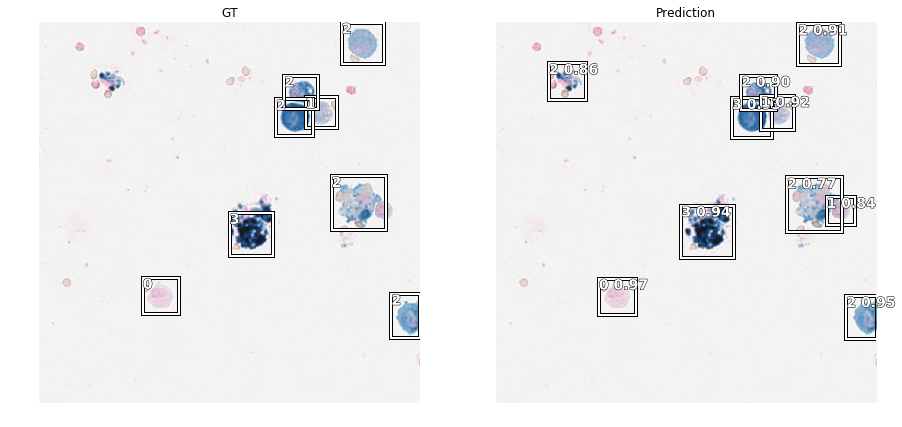

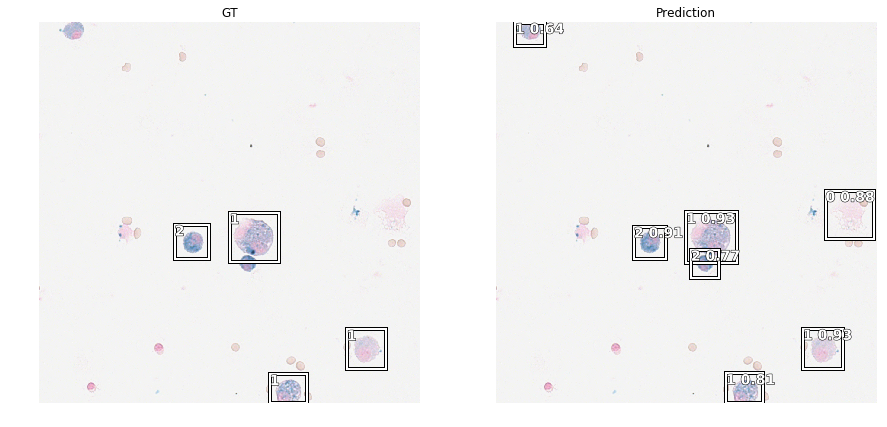

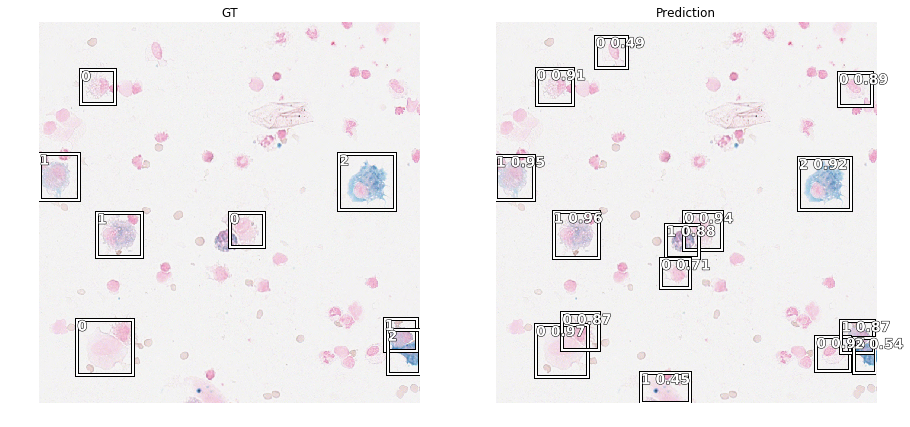

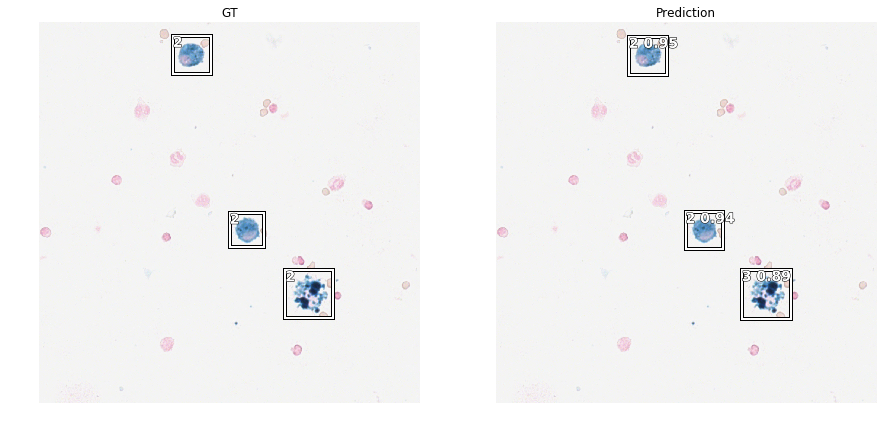

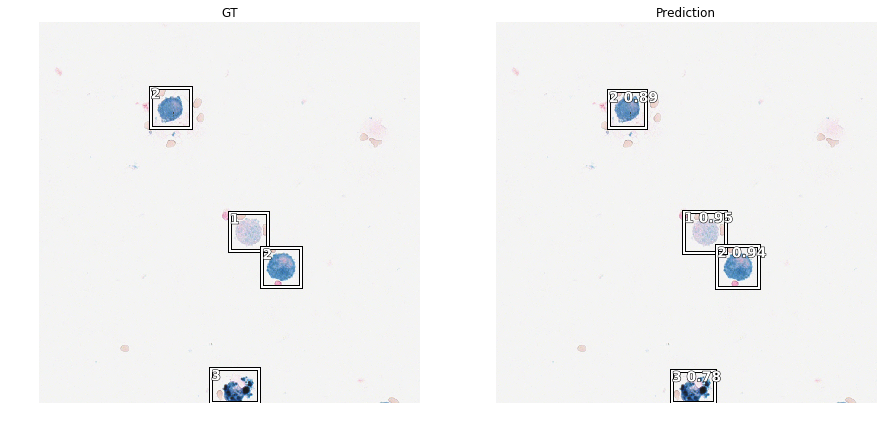

In [24]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)